In [1]:
#All packages needed to run TwINFER simulation and inference are listed here. 
#If any of them are not installed, please install them using pip or conda env.
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numba
import tqdm
import scipy
import seaborn
import os
import sys
import joblib
from itertools import product

/Users/idabueschel/miniconda3/envs/twinfer/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


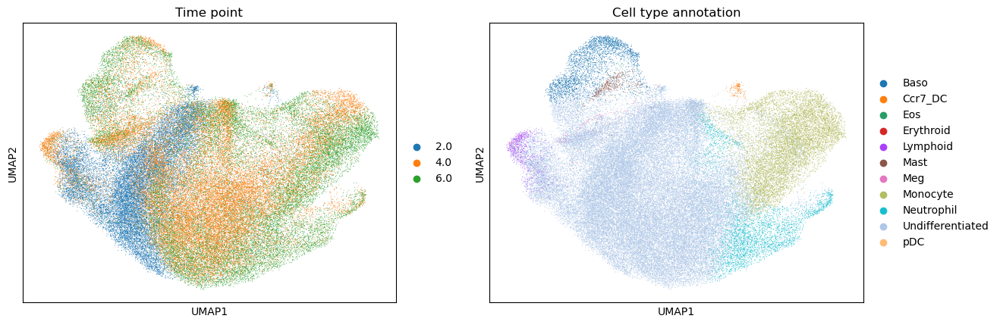

In [2]:
import scanpy as sc

# Load data
adata = sc.read_h5ad('/Users/idabueschel/Code/twin project/datasets/LSK_d2_d4_d6.h5ad')
adata.obs_names_make_unique()

# Plot UMAP
sc.pl.umap(adata, color=['Time point', 'Cell type annotation'])

In [3]:
### Create input file

# Separate by time point
t1 = 2
t2 = 4

adata_t1 = adata[(adata.obs['Time point'] == t1) & (adata.obs['clone_id'] != -1)]
adata_t2 = adata[(adata.obs['Time point'] == t2) & (adata.obs['clone_id'] != -1)]

# Pick subset of genes
# gene_list = ['Muc13', 'Srgn', 'Ccl9', 'Elane', 'Igfbp4', 'Rbms1', 'Sirpa', 'Set', 'Tk1', 'Spp1']
# gene_list = ['Pou5f1', 'Sox2', 'Nanog', 'Klf4', 'Myc', 'Zfp42', 'Zfp281']
gene_list = ['Sp1', 'Nfya', 'E2f1', 'Myc', 'Max', 'Nrf1', 'Tbp', 'Taf1', 'Atf4', 'Creb1', 'Usf1', 'Sp3', 'Klf4', 'Cebpb', 'Yy1']
gene_subset = [s + '_mRNA' for s in gene_list]

# Find across t clones
across_t_clones = np.array(list(set(adata_t1.obs.clone_id.value_counts().index[adata_t1.obs.clone_id.value_counts() == 1]).intersection(adata_t2.obs.clone_id.unique())))

# From each clone, randomly pick a differentiated cell
t1_across_t_clones_cells = {}
t2_across_t_clones_cells = {}
adata_t2_across = adata_t2[adata_t2.obs.clone_id.isin(across_t_clones)]
for clone in across_t_clones:
    t1_across_t_clones_cells[clone] = adata_t1[adata_t1.obs.clone_id == clone].obs_names[0]
    idx = adata_t2_across[adata_t2_across.obs.clone_id == clone].obs_names
    t2_across_t_clones_cells[clone] = np.random.choice(idx, size=1)[0]

# create csv file
across_t_data_t1 = pd.DataFrame(columns=['clone_id', 'cell_id', 'time_step', 'replicate'] + gene_subset)
across_t_data_t1['cell_id'] = list(t1_across_t_clones_cells.values())
across_t_data_t1['clone_id'] = list(t1_across_t_clones_cells.keys())
across_t_data_t1['time_step'] = np.repeat(t1, len(across_t_data_t1))
across_t_data_t1['replicate'] = np.repeat(1, len(across_t_data_t1))
across_t_data_t1[gene_subset] = adata_t1[across_t_data_t1['cell_id'], gene_list].X.toarray()

across_t_data_t2 = pd.DataFrame(columns=['clone_id', 'cell_id', 'time_step', 'replicate'] + gene_subset)
across_t_data_t2['cell_id'] = list(t2_across_t_clones_cells.values())
across_t_data_t2['clone_id'] = list(t2_across_t_clones_cells.keys())
across_t_data_t2['time_step'] = np.repeat(t2, len(across_t_data_t2))
across_t_data_t2['replicate'] = np.repeat(2, len(across_t_data_t2))
across_t_data_t2[gene_subset] = adata_t2[across_t_data_t2['cell_id'], gene_list].X.toarray()

across_t_data = pd.concat([across_t_data_t1, across_t_data_t2])
# across_t_data.to_csv('LARRY_across_t_twins.csv')

# Excluding across t clones, pick all two-cell clones from t1
temp = adata_t1[~adata_t1.obs.clone_id.isin(across_t_clones)].obs.clone_id.value_counts()
t1_clones = np.array(list(temp.index[temp == 2]))

# create csv file
t1_data = pd.DataFrame(columns=['clone_id', 'cell_id', 'time_step', 'replicate'] + gene_subset)
t1_data['cell_id'] = adata_t1[adata_t1.obs.clone_id.isin(t1_clones)].obs_names
t1_data['clone_id'] = adata_t1[adata_t1.obs.clone_id.isin(t1_clones)].obs['clone_id'].values
t1_data['time_step'] = np.repeat(t1, len(t1_data))
t1_data['replicate'] = t1_data.groupby("clone_id").cumcount() + 1
t1_data[gene_subset] = adata_t1[t1_data['cell_id'], gene_list].X.toarray()
# t1_data.to_csv('LARRY_t1_twins.csv')

# Excluding across t clones, find clones with 2 cells
temp = adata_t2[(~adata_t2.obs.clone_id.isin(across_t_clones)) & (~adata_t2.obs.clone_id.isin(t1_clones))].obs.clone_id.value_counts()
# t2_clones = np.array(list(temp.index[temp == 2]))
t2_clones = np.array(list(temp.index[temp != 1]))

# From each of these clones, randomly pick two cells
adata_t2_within = adata_t2[adata_t2.obs.clone_id.isin(t2_clones)]
t2_within_clones_cells = {}
for clone in t2_clones:
    idx = adata_t2_within[adata_t2_within.obs.clone_id == clone].obs_names
    t2_within_clones_cells[clone] = list(np.random.choice(idx, size=2))

t2_data = pd.DataFrame(columns=['clone_id', 'cell_id', 'time_step', 'replicate'] + gene_subset)
# t2_data['cell_id'] = adata_t2[adata_t2.obs.clone_id.isin(t2_clones)].obs_names
# t2_data['clone_id'] = adata_t2[adata_t2.obs.clone_id.isin(t2_clones)].obs['clone_id'].values
t2_data['cell_id'] = np.array(list(t2_within_clones_cells.values())).reshape(-1)
t2_data['clone_id'] = np.repeat(np.array(list(t2_within_clones_cells.keys())), 2)
t2_data['time_step'] = np.repeat(t2, len(t2_data))
t2_data['replicate'] = t2_data.groupby("clone_id").cumcount() + 1
t2_data[gene_subset] = adata_t2[t2_data['cell_id'], gene_list].X.toarray()
# t2_data.to_csv('LARRY_t2_twins.csv')

# Subsample if t1_data << t2_data
if int(t1_data.shape[0]/2)*1.5 <= int(t2_data.shape[0]/2):
    t2_clones = t2_data.clone_id.unique()
    np.random.seed(42)
    t2_clones_sub = np.random.choice(t2_clones, size=int(t1_data.shape[0]/2), replace=False)
    t2_data = t2_data[t2_data.clone_id.isin(t2_clones_sub)]

# t1_data = pd.read_csv('/Users/idabueschel/Code/twINFER/TwINFER/LARRY_t1_twins.csv', index_col=0, sep=',')
# t2_data = pd.read_csv('/Users/idabueschel/Code/twINFER/TwINFER/LARRY_t2_twins.csv', index_col=0, sep=',')
# across_t_data = pd.read_csv('/Users/idabueschel/Code/twINFER/TwINFER/LARRY_across_t_twins.csv', index_col=0, sep=',')

twin_data = pd.concat([t1_data, t2_data, across_t_data])
# twin_data.to_csv('LARRY_twins.csv')

In [4]:
print(f"Number of t1 twins: {int(t1_data.shape[0]/2)}")
print(f"Number of t2 twins: {int(t2_data.shape[0]/2)}")
print(f"Number of across t twins: {int(across_t_data.shape[0]/2)}")

Number of t1 twins: 621
Number of t2 twins: 621
Number of across t twins: 593


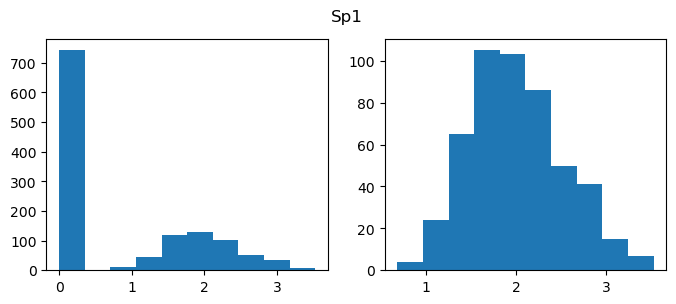

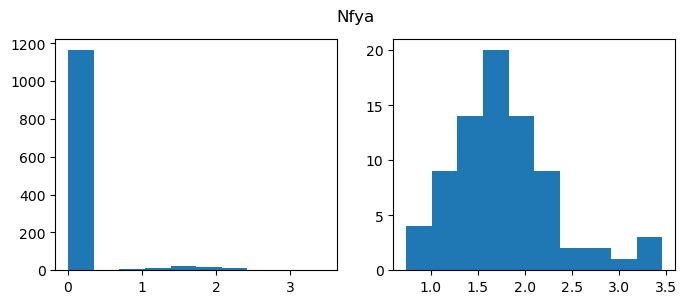

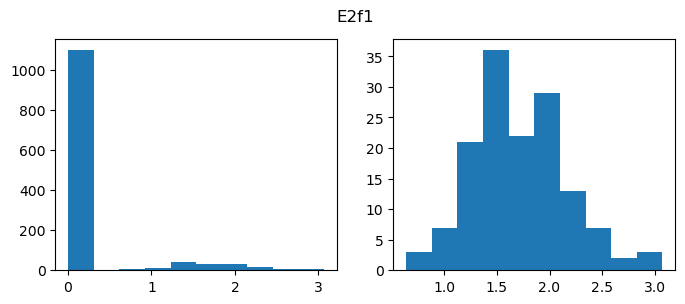

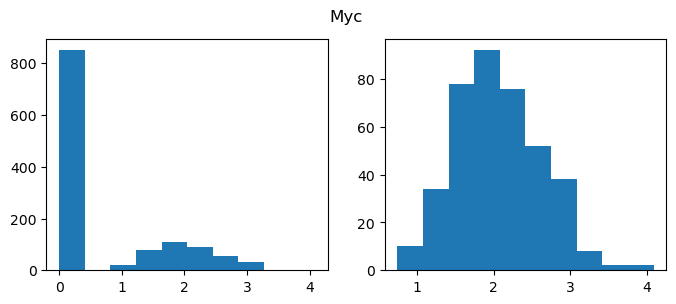

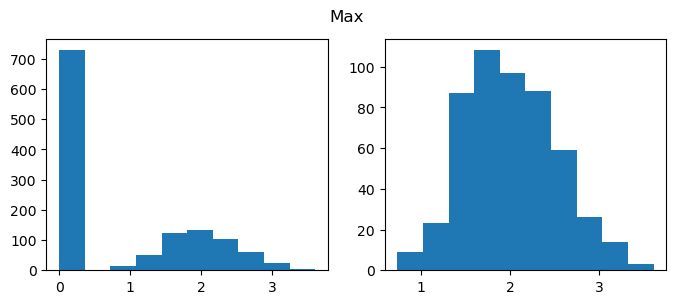

...

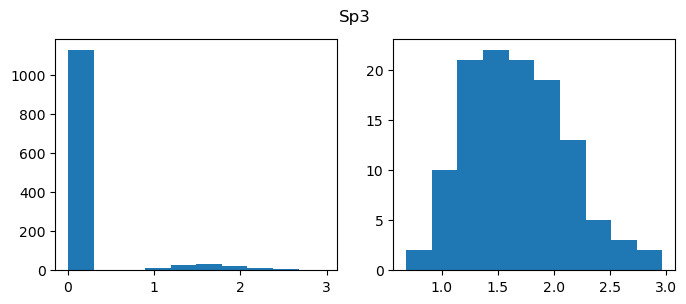

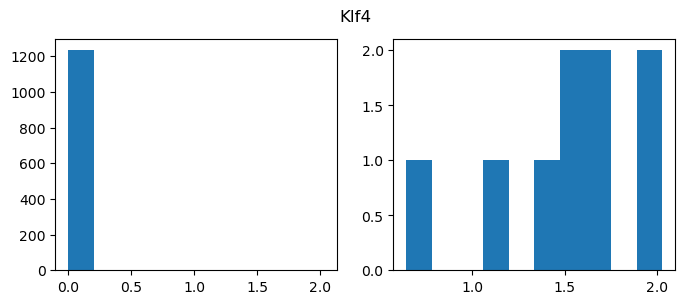

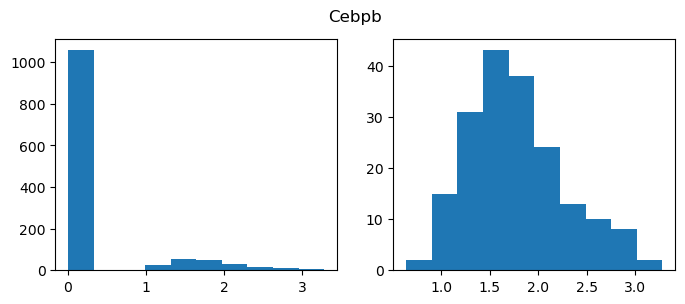

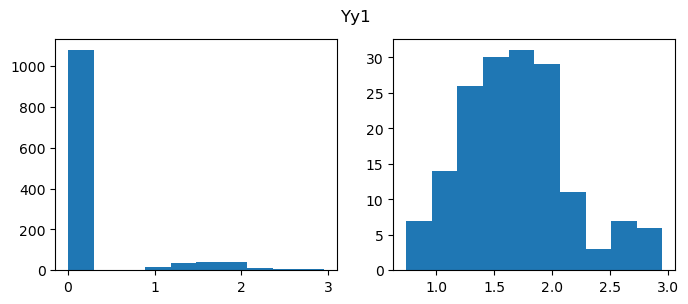

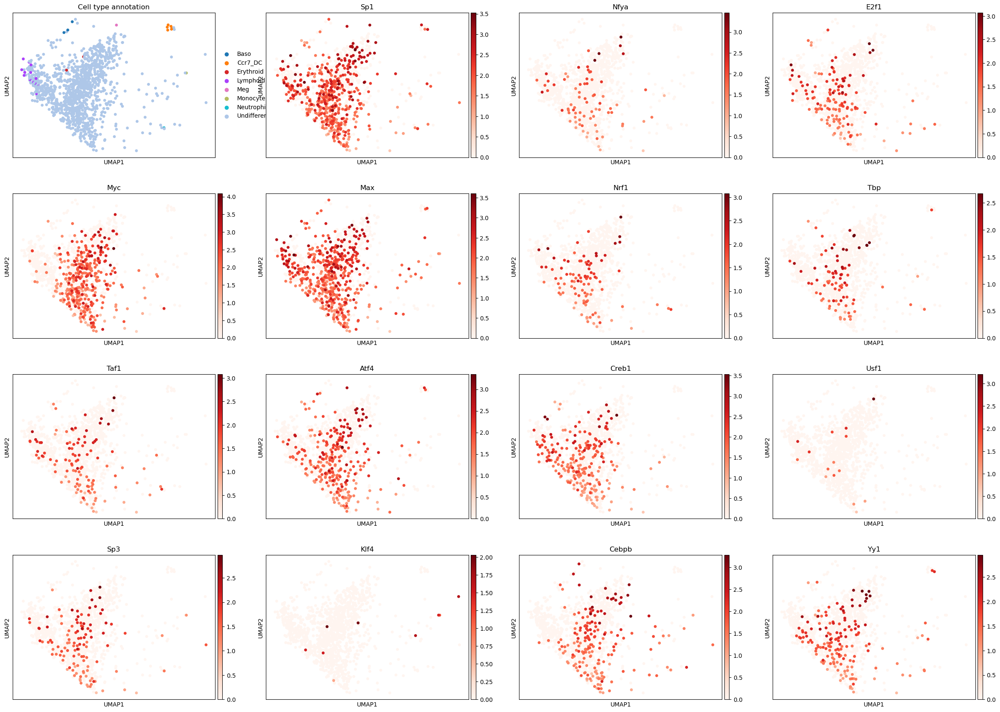

In [14]:
adata_temp = adata_t1[adata_t1.obs['clone_id'].isin(t1_data.clone_id.unique()), gene_list].copy()
for gene in gene_list:
    fig, ax = plt.subplots(1,2, figsize=(8,3))
    data = adata_temp[:, gene].X.toarray()
    ax[0].hist(data)
    ax[1].hist(data[data != 0])
    plt.suptitle(gene)
    plt.show()

sc.pl.umap(adata_temp, color=['Cell type annotation'] + gene_list, cmap='Reds')

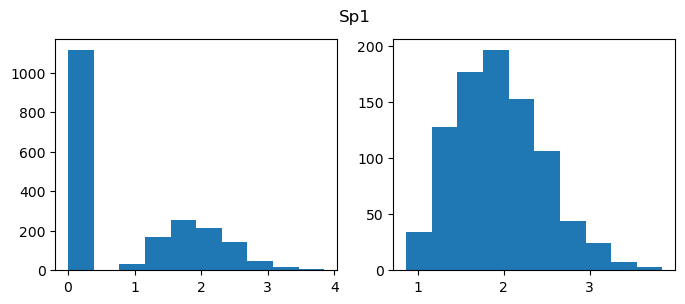

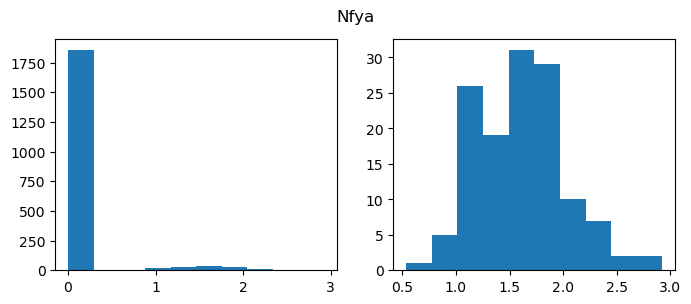

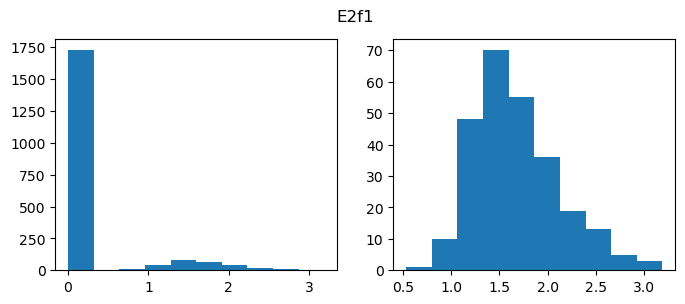

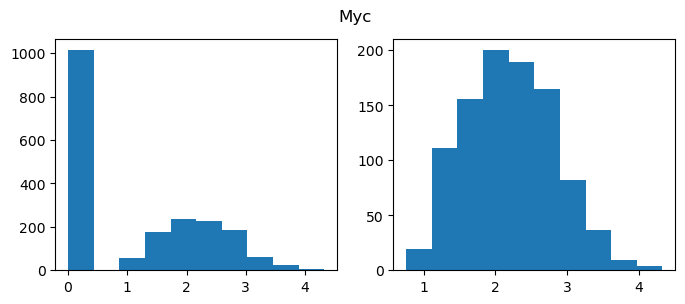

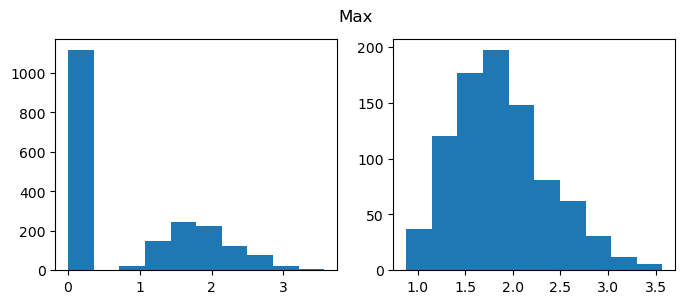

...

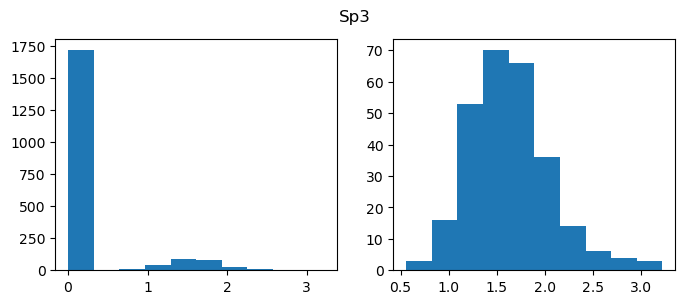

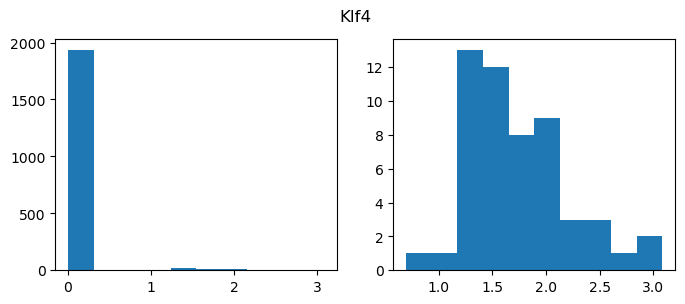

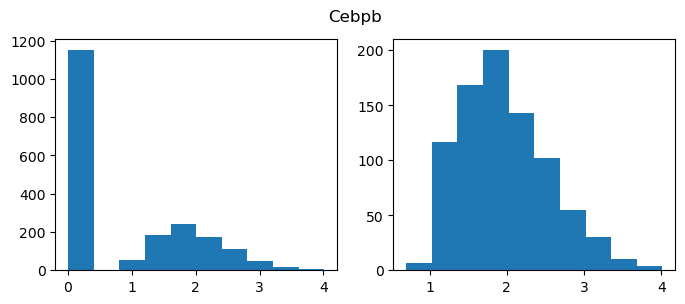

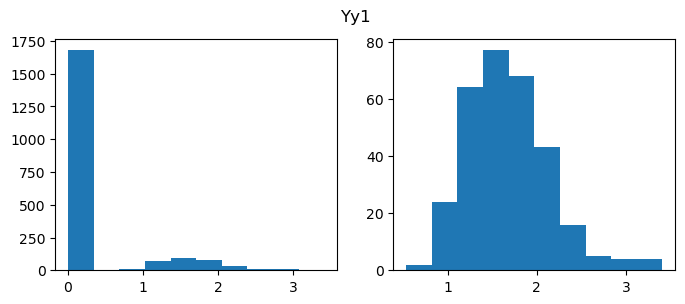

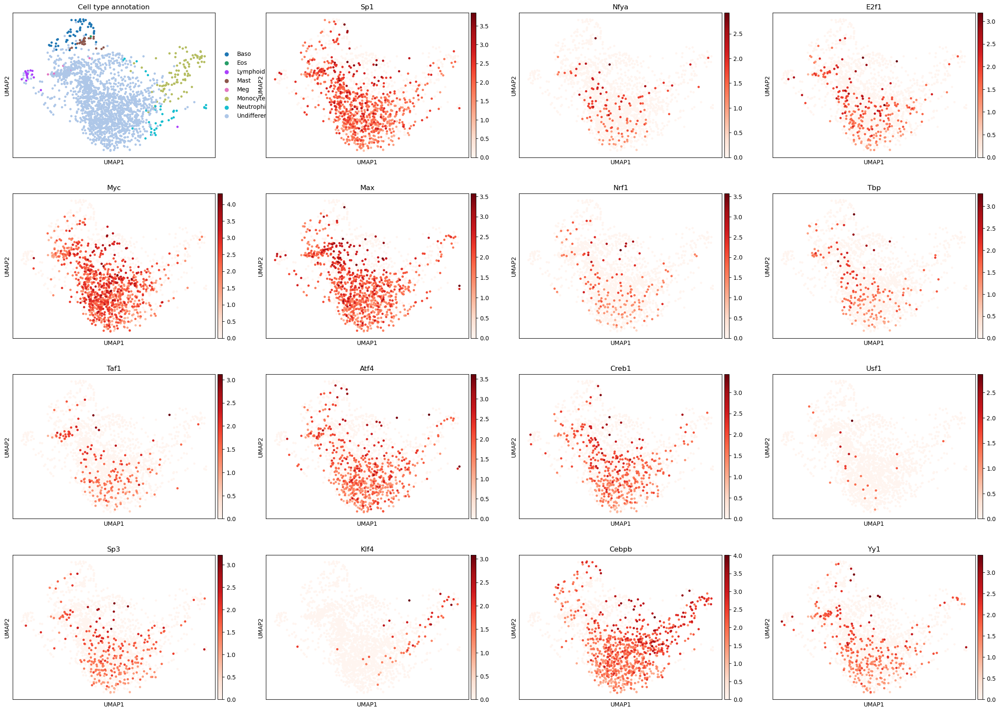

In [15]:
adata_temp = adata_t2[adata_t2.obs['clone_id'].isin(t2_data.clone_id.unique()), gene_list].copy()
for gene in gene_list:
    fig, ax = plt.subplots(1,2, figsize=(8,3))
    data = adata_temp[:, gene].X.toarray()
    ax[0].hist(data)
    ax[1].hist(data[data != 0])
    plt.suptitle(gene)
    plt.show()

sc.pl.umap(adata_temp, color=['Cell type annotation'] + gene_list, cmap='Reds')

In [3]:
# Calculation functions
import importlib
from TwINFER_function_scripts import correlation_analysis_functions
from TwINFER_function_scripts import correlation_analysis_helpers

importlib.reload(correlation_analysis_functions)
importlib.reload(correlation_analysis_helpers)

from TwINFER_function_scripts.correlation_analysis_functions import (
    
    calculate_pairwise_gene_gene_correlation_matrix,
    check_system_in_steady_state,
    check_gene_gene_correlation_threshold,
    calculate_twin_random_pair_correlations,
    differentiate_single_state_reg_and_multiple_states,
    identify_reg_if_multiple_states,
    get_cross_correlations,
    identify_actual_directed_edges
)

# Helper functions
from TwINFER_function_scripts.correlation_analysis_helpers import (
    extract_param_index,
    read_input_matrix,
    get_param_data, 
    plot_matrix_as_heatmap,
    print_summary,
    plot_network
)

In [157]:
# Split
t1_clones = t1_data.clone_id.values
t2_clones = t2_data.clone_id.values
across_t_clones = across_t_data.clone_id.values

# Subset directly
t1_twins = t1_data
t2_twins = t2_data

# Across_t: pick exactly one random twin per clone_id
# One cell per clone at t1
across_t_twin1 = across_t_data[across_t_data.time_step == t1]
across_t_twin2 = across_t_data[across_t_data.time_step == t2]

# Reset index for cleanliness
t1_twins = t1_twins.reset_index(drop=True)
t2_twins = t2_twins.reset_index(drop=True)
across_t_twin1 = across_t_twin1.reset_index(drop=True)
across_t_twin2 = across_t_twin2.reset_index(drop=True)

all_t1_t2_measurements = pd.concat(
[t1_twins, t2_twins, across_t_twin1, across_t_twin2],
ignore_index=True
)

In [158]:
# Define input parameters
plot_correlation_matrices_as_heatmap = True
have_any_output = True
threshold_gene_gene_corr = 0.03
p_val_threshold_scrambled_gene_correlation = 0.05
show_scrambled_distribution_gene_correlation = True
z_score_threshold_two_states = 10

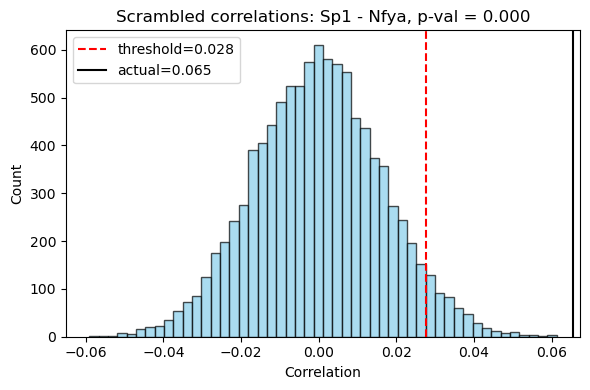

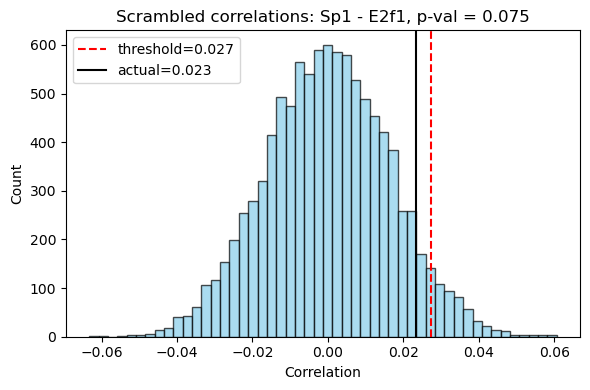

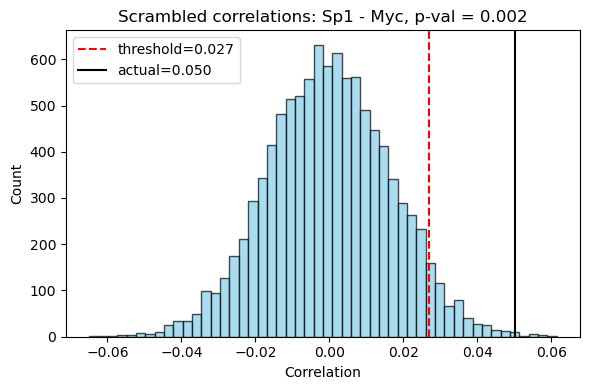

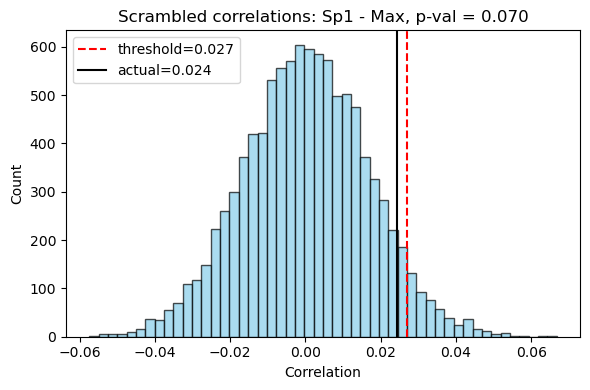

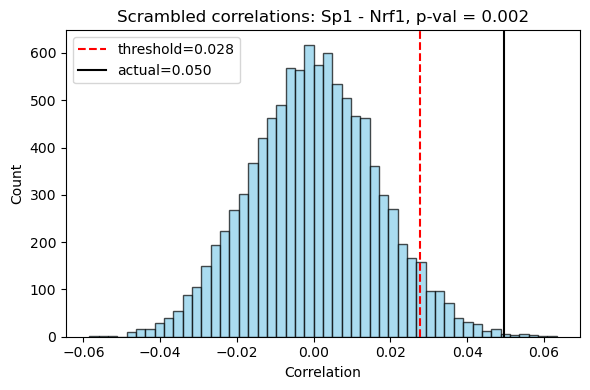

...

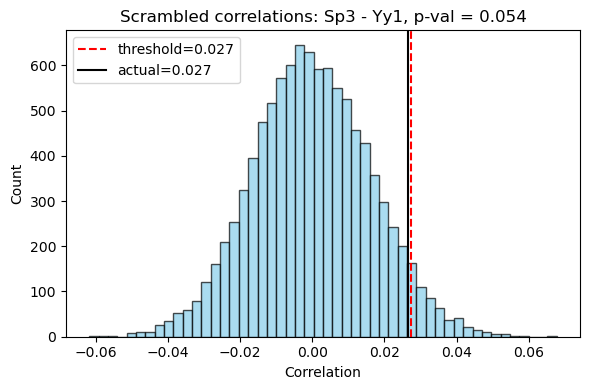

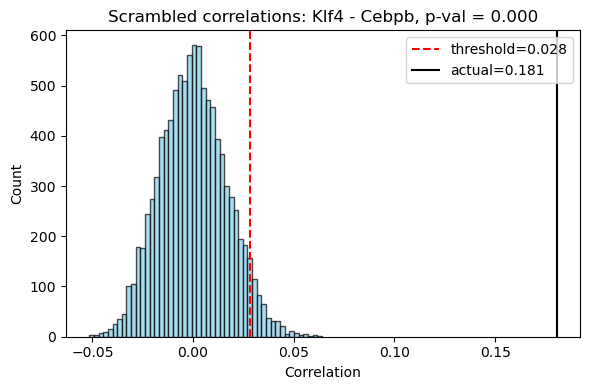

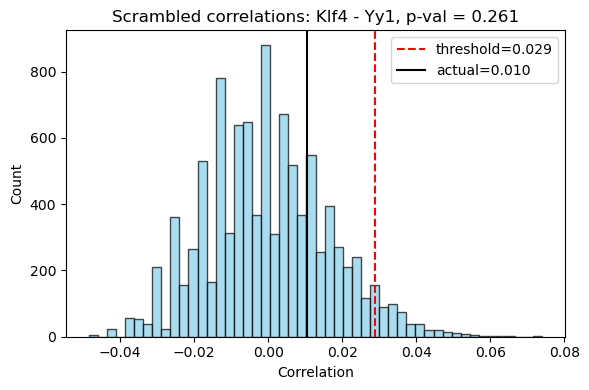

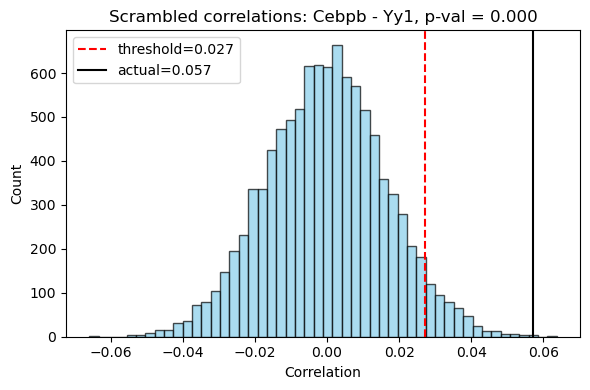

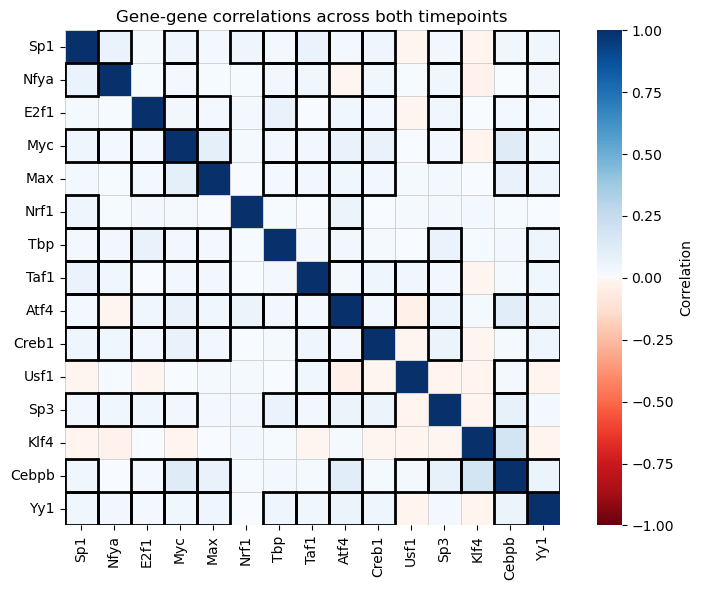

In [159]:
# --- Step 1: Pairwise gene-gene correlations at t1 ---
pairwise_gene_gene_correlation_matrix = calculate_pairwise_gene_gene_correlation_matrix(
    all_t1_t2_measurements, gene_list
)
no_regulation, potential_regulation, corr_threshold_used = check_gene_gene_correlation_threshold(
    all_t1_t2_measurements, pairwise_gene_gene_correlation_matrix, gene_list,  threshold = threshold_gene_gene_corr, use_scramble = True, p_val_threshold = p_val_threshold_scrambled_gene_correlation, verbose = show_scrambled_distribution_gene_correlation
)
            
# print(no_regulation)
if plot_correlation_matrices_as_heatmap:
    plot_matrix_as_heatmap(corr_matrix=pairwise_gene_gene_correlation_matrix, gene_list=gene_list, no_regulation=no_regulation, potential_regulation=potential_regulation,
        title=f"Gene-gene correlations across both timepoints", add_gene_labels=True, add_time=False, gray_out_no_reg=False
    )

In [ ]:
### plotting functions ###

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.colors import TwoSlopeNorm, Normalize, LinearSegmentedColormap

def make_reds_blues_colormap():
    reds = plt.cm.Reds(np.linspace(1, 0, 128))   # deep red → white
    blues = plt.cm.Blues(np.linspace(0, 1, 128)) # white → deep blue
    colors = np.vstack((reds, blues))
    return LinearSegmentedColormap.from_list('RedsBlues', colors)

def plot_matrix_as_heatmap(corr_matrix, gene_list, no_regulation=None, potential_regulation=None, title=None, add_gene_labels=True,
                            add_time=False, time=None, gray_out_no_reg=False, vmin=None, vmax=None, cmap=None, 
                            return_plot=False, black_out_self=False):
    """
    Plot a gene-gene correlation matrix as a heatmap with regulatory overlays and dynamic formatting.
    """

    if add_time:
        if time is None or not isinstance(time, (list, tuple)) or len(time) == 0:
            raise ValueError("If add_time=True, you must provide a non-empty list of 1 or 2 time values in `time`.")
        if len(time) > 2:
            raise ValueError("Time can have at most two entries.")

    # Format gene names: gene_1 → g1
    base_names = [g.replace("gene_", "g") for g in gene_list]

    # Format axis labels
    if add_gene_labels:
        if add_time:
            if len(time) == 1:
                # row_labels = [f"$g{i}_{{{time[0]}}}$" for i in range(1, len(base_names) + 1)]
                # col_labels = row_labels
                row_labels = gene_list
                col_labels = gene_list
            else:
                # row_labels = [f"$g{i}_{{{time[0]}}}$" for i in range(1, len(base_names) + 1)]
                # col_labels = [f"$g{i}_{{{time[1]}}}$" for i in range(1, len(base_names) + 1)]
                row_labels = [f"${gene}_{{{time[0]}}}$" for gene in gene_list]
                col_labels = [f"${gene}_{{{time[1]}}}$" for gene in gene_list]
        else:
            row_labels = base_names
            col_labels = base_names
    else:
        row_labels = [""] * len(gene_list)
        col_labels = [""] * len(gene_list)

    # Prepare plot matrix
    plot_matrix = corr_matrix.copy()

    # --- Handle masking ---
    mask = np.zeros_like(plot_matrix.values, dtype=bool)
    if gray_out_no_reg and no_regulation:
        for g1, g2 in no_regulation:
            if g1 in gene_list and g2 in gene_list:
                i = gene_list.index(g1)
                j = gene_list.index(g2)
                plot_matrix.iloc[i, j] = 0
                mask[i, j] = True

    # --- Handle vmin/vmax auto-scaling ---
    data_values = plot_matrix.values.flatten()
    data_values = data_values[~np.isnan(data_values)]

    if len(data_values) == 0:
        vmin, vmax = -1.0, 1.0
    else:
        if vmin is None:
            vmin = np.min(data_values)
        if vmax is None:
            vmax = np.max(data_values)
        if vmin == vmax:
            vmin -= 1e-4
            vmax += 1e-4

    # --- Choose colormap adaptively ---
    if cmap is None and vmin < 0 and vmax > 0:
        cmap = make_reds_blues_colormap()
        center_span = max(abs(vmin), abs(vmax))
        norm = TwoSlopeNorm(vmin=-center_span, vcenter=0.0, vmax=center_span)
    else:
        norm = None
        if cmap is None:
            cmap = "Blues" if vmin >= 0 else "Reds"

    # --- Plot heatmap ---
    fig, ax = plt.subplots(figsize=(8, 6))
    heatmap = sns.heatmap(
        plot_matrix,
        ax=ax,
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        norm=norm,
        xticklabels=col_labels,
        yticklabels=row_labels,
        square=True,
        cbar_kws={'label': 'Correlation'},
        linewidths=0.5,
        linecolor='lightgray',
        mask=mask
    )

    # --- Add regulation boxes ---
    if potential_regulation:
        for g1, g2 in potential_regulation:
            if g1 in gene_list and g2 in gene_list:
                i = gene_list.index(g1)
                j = gene_list.index(g2)
                rect = Rectangle((j, i), 1, 1, fill=False, edgecolor='black', linewidth=2)
                ax.add_patch(rect)

    # --- Black out diagonal if requested ---
    if black_out_self:
        for k in range(len(gene_list)):
            rect = Rectangle((k, k), 1, 1, facecolor='#D9D9D9', edgecolor='#D9D9D9')
            ax.add_patch(rect)

    # --- Title ---
    if title:
        if add_time:
            if len(time) == 1:
                title += f" @ time d{time[0]}"
            elif len(time) == 2:
                title += f" (rows: d{time[0]}, cols: d{time[1]})"
        ax.set_title(title, fontsize=12)

    plt.tight_layout()
    if return_plot:
        return fig, ax
    else:
        plt.show()


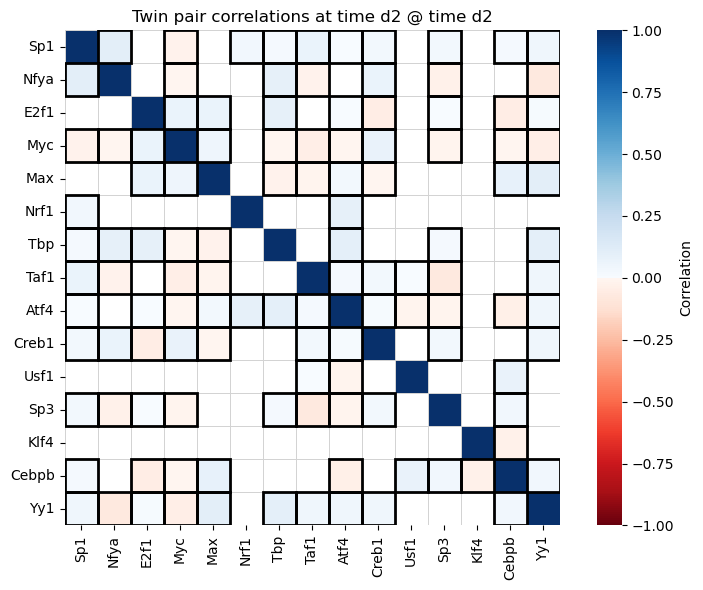

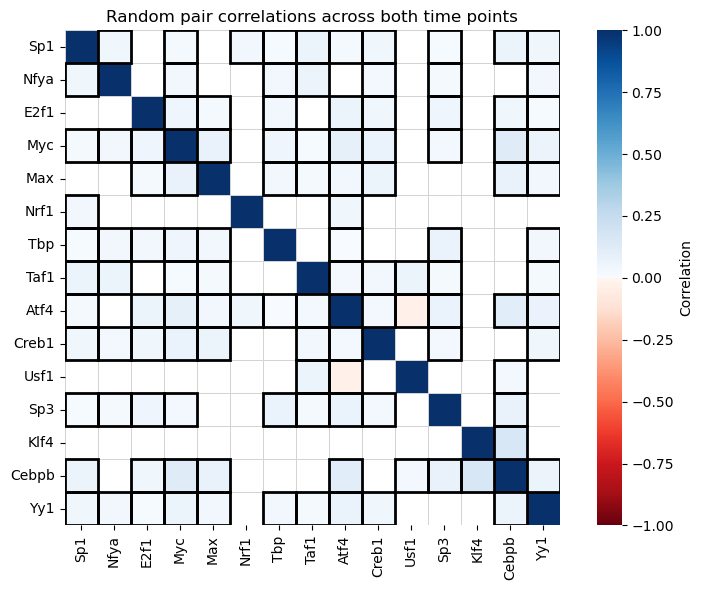

In [161]:
# --- Step 2: Twin/random correlations at t2 ---
twin_pair_correlation_matrix_t1, random_pair_correlation_matrix_t2 = calculate_twin_random_pair_correlations(
    all_t1_t2_measurements, t1_twins, gene_list
)
# print(twin_pair_correlation_matrix_t2)
if plot_correlation_matrices_as_heatmap:
    plot_matrix_as_heatmap( corr_matrix=twin_pair_correlation_matrix_t1, gene_list=gene_list, no_regulation=no_regulation, potential_regulation=potential_regulation,
        title=f"Twin pair correlations at time d{t1}", add_gene_labels=True, add_time=True, time=[t1], gray_out_no_reg=True
    )
    
    plot_matrix_as_heatmap( corr_matrix=random_pair_correlation_matrix_t2, gene_list=gene_list, no_regulation=no_regulation, potential_regulation=potential_regulation,
        title=f"Random pair correlations across both time points", add_gene_labels=True, add_time=False, time=[t1], gray_out_no_reg=True
    )

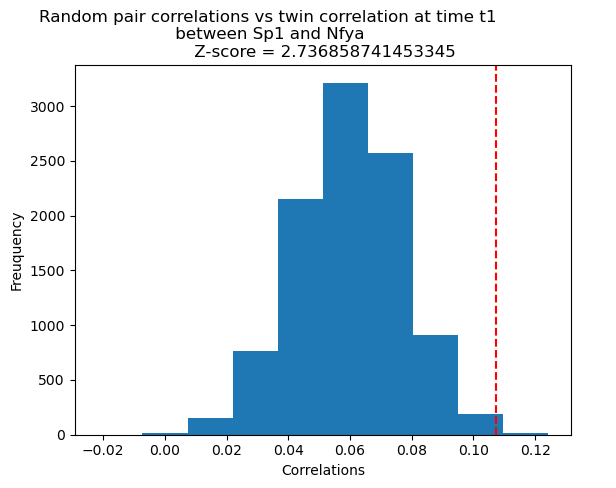

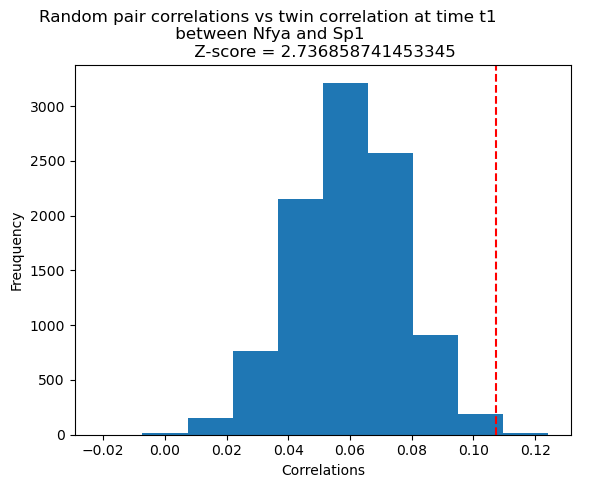

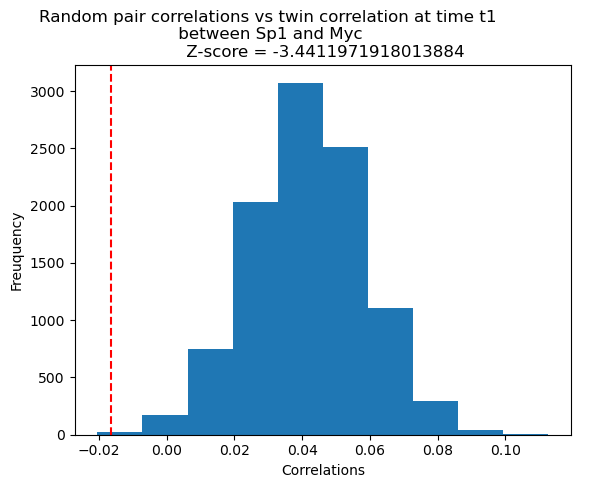

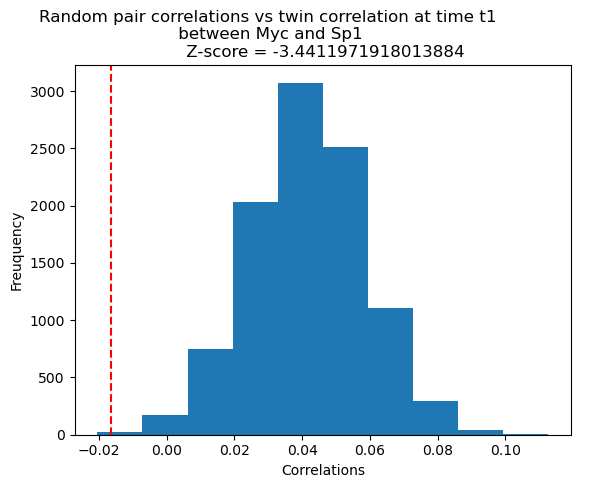

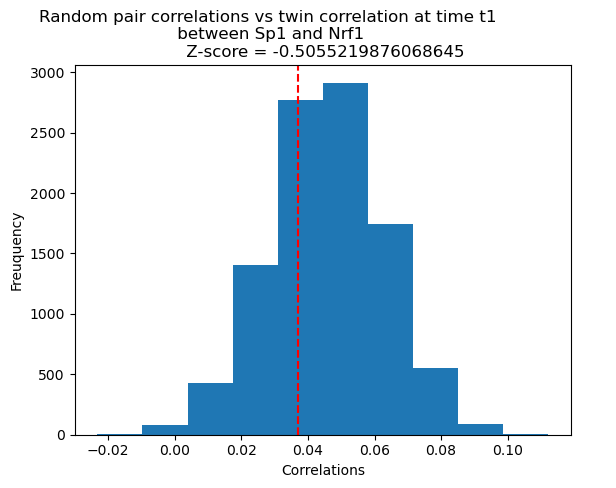

...

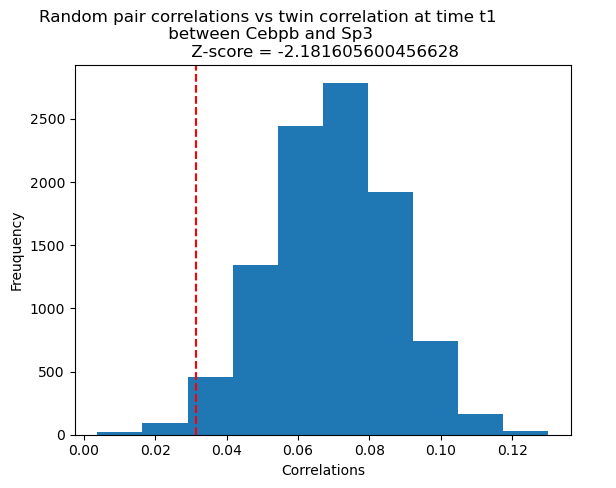

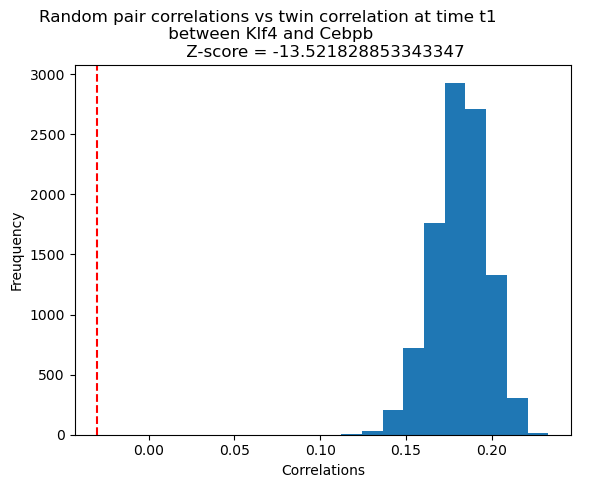

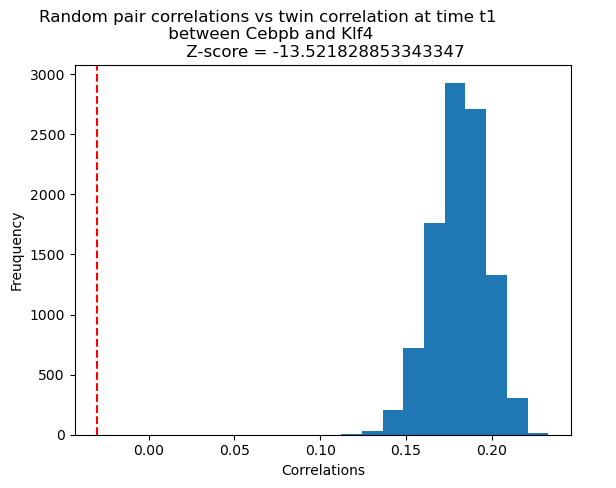

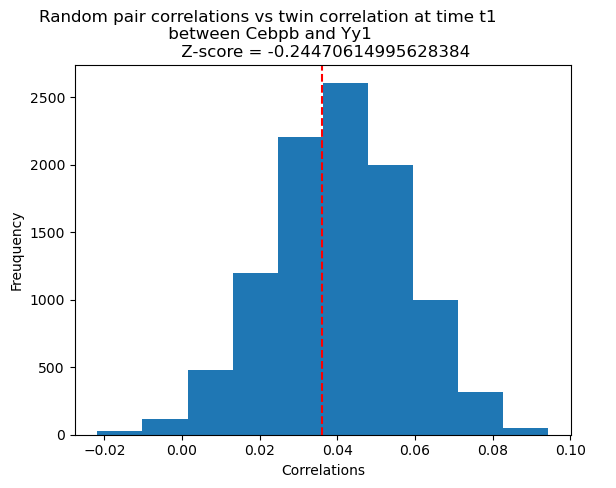

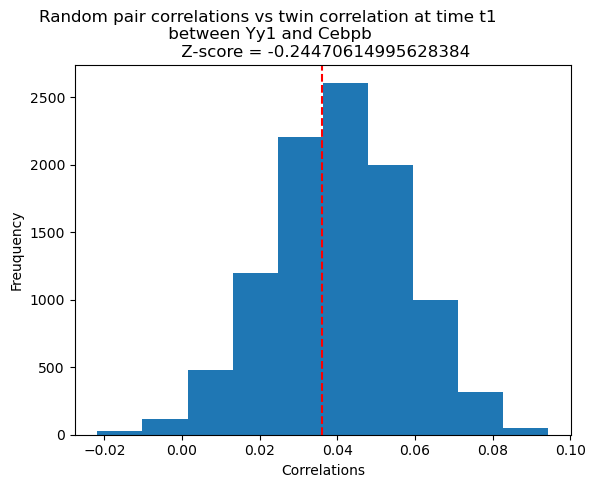

Testing for multiple states. Correlation at time t1 = -0.029898925813790066 and at time t2 = 0.1501031862634329
Testing for multiple states. Correlation at time t1 = -0.029898925813790066 and at time t2 = 0.15010318626343286


In [162]:
# --- Step 3: Classify regulation type: single-state vs multiple-states ---
multiple_states_gene_pairs, single_state_regulation = differentiate_single_state_reg_and_multiple_states(
    all_t1_t2_measurements, potential_regulation, twin_pair_correlation_matrix_t1, random_pair_correlation_matrix_t2, gene_list, z_score_threshold=z_score_threshold_two_states
)
twin_pair_correlation_matrix_t2, random_pair_correlation_matrix_t1 = calculate_twin_random_pair_correlations(
            all_t1_t2_measurements, t2_twins, gene_list
        )
if len(multiple_states_gene_pairs) > 0:

    multiple_states_no_reg, multiple_states_and_reg = identify_reg_if_multiple_states(
        twin_pair_correlation_matrix_t1,twin_pair_correlation_matrix_t2,random_pair_correlation_matrix_t1,
        random_pair_correlation_matrix_t2,multiple_states_gene_pairs,gene_list
        )
else:
    multiple_states_no_reg, multiple_states_and_reg = [], []

In [163]:
# --- Step 4: Print summary of results ---
all_gene_pairs = list(product(gene_list, repeat=2))
if have_any_output:
    print_summary(no_regulation, single_state_regulation, multiple_states_no_reg, multiple_states_and_reg)


1. No Regulation
  Sp1 - E2f1
  E2f1 - Sp1
  Sp1 - Max
  Max - Sp1
  Sp1 - Usf1
  Usf1 - Sp1
  Sp1 - Klf4
  Klf4 - Sp1
  Nfya - E2f1
  E2f1 - Nfya
  Nfya - Max
  Max - Nfya
  Nfya - Nrf1
  Nrf1 - Nfya
  Nfya - Atf4
  Atf4 - Nfya
  Nfya - Usf1
  Usf1 - Nfya
  Nfya - Klf4
  Klf4 - Nfya
  Nfya - Cebpb
  Cebpb - Nfya
  E2f1 - Nrf1
  Nrf1 - E2f1
  E2f1 - Taf1
  Taf1 - E2f1
  E2f1 - Usf1
  Usf1 - E2f1
  E2f1 - Klf4
  Klf4 - E2f1
  Myc - Nrf1
  Nrf1 - Myc
  Myc - Usf1
  Usf1 - Myc
  Myc - Klf4
  Klf4 - Myc
  Max - Nrf1
  Nrf1 - Max
  Max - Usf1
  Usf1 - Max
  Max - Sp3
  Sp3 - Max
  Max - Klf4
  Klf4 - Max
  Nrf1 - Tbp
  Tbp - Nrf1
  Nrf1 - Taf1
  Taf1 - Nrf1
  Nrf1 - Creb1
  Creb1 - Nrf1
  Nrf1 - Usf1
  Usf1 - Nrf1
  Nrf1 - Sp3
  Sp3 - Nrf1
  Nrf1 - Klf4
  Klf4 - Nrf1
  Nrf1 - Cebpb
  Cebpb - Nrf1
  Nrf1 - Yy1
  Yy1 - Nrf1
  Tbp - Taf1
  Taf1 - Tbp
  Tbp - Creb1
  Creb1 - Tbp
  Tbp - Usf1
  Usf1 - Tbp
  Tbp - Klf4
  Klf4 - Tbp
  Tbp - Cebpb
  Cebpb - Tbp
  Taf1 - Klf4
  Klf4 - Taf1
  Taf1 -

['Atf4', 'Cebpb', 'Creb1', 'E2f1', 'Max', 'Myc', 'Nfya', 'Nrf1', 'Sp1', 'Sp3', 'Taf1', 'Tbp', 'Usf1', 'Yy1']
[('Myc', 'Sp1'), ('Sp1', 'Creb1'), ('Nfya', 'Sp3'), ('Yy1', 'Nfya'), ('Myc', 'E2f1'), ('Max', 'E2f1'), ('E2f1', 'Tbp'), ('Tbp', 'E2f1'), ('Creb1', 'E2f1'), ('E2f1', 'Sp3'), ('Myc', 'Tbp'), ('Myc', 'Taf1'), ('Taf1', 'Myc'), ('Atf4', 'Myc'), ('Myc', 'Sp3'), ('Myc', 'Cebpb'), ('Max', 'Taf1'), ('Atf4', 'Max'), ('Yy1', 'Max'), ('Nrf1', 'Atf4'), ('Yy1', 'Tbp'), ('Atf4', 'Taf1'), ('Taf1', 'Creb1'), ('Cebpb', 'Atf4'), ('Yy1', 'Atf4'), ('Usf1', 'Cebpb'), ('Cebpb', 'Sp3'), ('Sp3', 'Sp3'), ('Atf4', 'Atf4'), ('Nrf1', 'Nrf1'), ('Sp1', 'Sp1'), ('Cebpb', 'Cebpb'), ('Taf1', 'Taf1')]


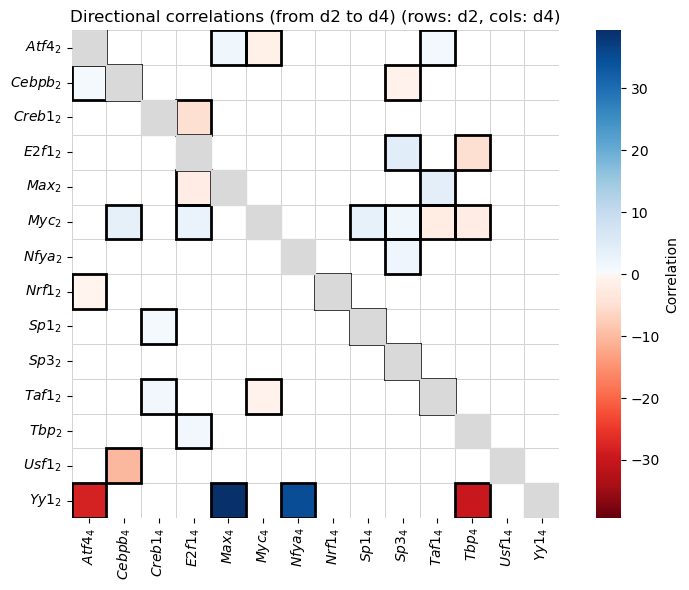

In [ ]:
# --- Step 5: Infer directionality of single-state interactions ---
infer_direction_for_which_edges = "single-state"
p_value_threshold_cross_correlation = 0.2

if infer_direction_for_which_edges == "single-state" :
    if len(single_state_regulation) > 0:
        single_state_regulation_list = {g for pair in single_state_regulation for g in pair}

        # Build self-pairs
        self_pairs = [(g, g) for g in single_state_regulation_list]

        # Append them
        all_gene_pairs = single_state_regulation + self_pairs
        direction_raw_matrix, direction_normalized_matrix = get_cross_correlations(across_t_twin1, across_t_twin2, gene_pairs=all_gene_pairs)
        
        final_directed_edges = identify_actual_directed_edges(across_t_twin1, across_t_twin2, direction_raw_matrix, gene_pairs=all_gene_pairs, threshold = p_value_threshold_cross_correlation)
    else:
        final_directed_edges = []
        direction_normalized_matrix = pd.DataFrame(
            np.zeros((len(gene_list), len(gene_list))),
            index=gene_list,
            columns=gene_list
        )
else:
    direction_raw_matrix, direction_normalized_matrix = get_cross_correlations(across_t_twin1, across_t_twin2, gene_pairs=all_gene_pairs)
    final_directed_edges = identify_actual_directed_edges(across_t_twin1, across_t_twin2, direction_raw_matrix, gene_pairs=all_gene_pairs, threshold = p_value_threshold_cross_correlation)
print(final_directed_edges)
# print(pre_threshold_direction_matrix)

if plot_correlation_matrices_as_heatmap:
    no_reg_pairs = [pair for pair in all_gene_pairs if pair not in final_directed_edges]
    plot_matrix_as_heatmap(
        corr_matrix=direction_normalized_matrix,
        gene_list=list(direction_normalized_matrix.index),
        no_regulation=no_reg_pairs,                   
        potential_regulation=final_directed_edges,     
        title=f"Directional correlations (from d{t1} to d{t2})",
        add_gene_labels=True,
        add_time=True,
        time=[t1, t2],
        gray_out_no_reg=True,
        black_out_self = True
    )

In [ ]:
### plotting functions ###

from matplotlib.colors import Normalize, LinearSegmentedColormap
from matplotlib.patches import Rectangle, FancyArrowPatch

def polygon_layout(gene_list, radius=1.0):
    n = len(gene_list)
    angles = np.linspace(0, 2 * np.pi, n, endpoint=False)
    return {
        gene_list[i]: (radius * np.cos(angle), radius * np.sin(angle))
        for i, angle in enumerate(angles)
    }

def make_reds_blues_colormap():
    reds = plt.cm.Reds(np.linspace(1, 0, 128))   # deep red → white
    blues = plt.cm.Blues(np.linspace(0, 1, 128)) # white → deep blue
    colors = np.vstack((reds, blues))
    return LinearSegmentedColormap.from_list('RedsBlues', colors)

def shrink_arrow_endpoints(x1, y1, x2, y2, shrink_source=0.2, shrink_target=0.2, lateral_offset=0.0, scaled_shrink_val = 0.25):
    dx, dy = x2 - x1, y2 - y1
    dist = np.hypot(dx, dy)

    if dist == 0:
        return (x1, y1), (x2, y2)

    scaled_shrink = scaled_shrink_val * dist  # 25% of distance, adjust as needed
    shrink_source = scaled_shrink
    shrink_target = scaled_shrink*0.8

    ux, uy = dx / dist, dy / dist
    orth_x, orth_y = -uy, ux
    x1_off = x1 + shrink_source * ux + lateral_offset * orth_x
    y1_off = y1 + shrink_source * uy + lateral_offset * orth_y
    x2_off = x2 - shrink_target * ux + lateral_offset * orth_x
    y2_off = y2 - shrink_target * uy + lateral_offset * orth_y
    return (x1_off, y1_off), (x2_off, y2_off)

def flat_t_head_arrow(start, end, color='red', linewidth=2, rad=0.2, abs_weight=0.5, ax=None):
    """Draw repression arrow with T-head scaled by abs_weight."""
    arrow = FancyArrowPatch(
        start, end,
        connectionstyle=f"arc3,rad={rad}",
        arrowstyle='-',
        color=color,
        linewidth=linewidth,
        zorder=1
    )
    ax.add_patch(arrow)

    x1, y1 = start
    x2, y2 = end
    dx, dy = x2 - x1, y2 - y1
    dist = np.hypot(dx, dy)
    if dist == 0:
        return

    ux, uy = dx / dist, dy / dist
    tx, ty = x2, y2
    px, py = -uy, ux

    # Scale T-head size with abs_weight (capped)
    t_len = 0.03 + 0.07 * min(abs_weight, 1.0)
    t_xs = [tx - px * t_len, tx + px * t_len]
    t_ys = [ty - py * t_len, ty + py * t_len]
    ax.plot(t_xs, t_ys, color=color, linewidth=linewidth, solid_capstyle='round', zorder=2)


def plot_network(correlation_matrix, gene_list, edges, title=None):
    DG = nx.DiGraph()
    for gene in gene_list:
        DG.add_node(gene)

    # Add all gene-gene interactions (even if directionless)
    # Add all gene-gene interactions (only if both exist in correlation_matrix)
    for g1 in gene_list:
        for g2 in gene_list:
            if g1 == g2:
                continue
            if g1 in correlation_matrix.index and g2 in correlation_matrix.columns:
                if (g1, g2) in edges:
                    val = correlation_matrix.loc[g1, g2]
                    if pd.notna(val):
                        DG.add_edge(g1, g2, weight=val)


    # Define node positions and colors
    pos = polygon_layout(gene_list, radius=max(2, len(gene_list) / 2)) if len(gene_list) > 2 else {
        gene_list[0]: (0, 0),
        gene_list[1]: (1, 0)
    }

    fig, ax = plt.subplots(figsize=(9, 9))
    node_colors = np.array([
    correlation_matrix.loc[g, g] if g in correlation_matrix.index and g in correlation_matrix.columns else 0
    for g in gene_list
    ])

    v = 1
    norm = Normalize(vmin=-v, vmax=v)
    cmap = make_reds_blues_colormap()
    node_rgba = cmap(norm(node_colors))
    node_rgba[:, -1] = 0.8

    nx.draw_networkx_nodes(DG, pos, ax=ax, node_color=node_rgba, node_size=6000, edgecolors='black', linewidths=1.5)

    print(DG.nodes)
    # labels = {node: f"$g{int(node.split('_')[-1])}$" for node in DG.nodes()}
    labels = {node: node for node in DG.nodes()}
    nx.draw_networkx_labels(DG, pos, labels=labels, font_size=16, ax=ax)

    # Draw edges
    for u, v in DG.edges():
        raw_weight = correlation_matrix.loc[u, v]
        if pd.isnull(raw_weight) or raw_weight == 0:
            continue

        x1, y1 = pos[u]
        x2, y2 = pos[v]
        offset = -0.15 if DG.has_edge(v, u) else 0.0
        rad = 0.2 if DG.has_edge(v, u) else 0.0
        start, end = shrink_arrow_endpoints(x1, y1, x2, y2, lateral_offset=offset)
        color = cmap(norm(raw_weight))
        abs_weight = abs(raw_weight)

        if raw_weight > 0:
            head_length = min(10 + abs_weight * 10, 20)
            head_width = min(10 + abs_weight * 10, 20)
            arrow_style = f'->,head_length={head_length},head_width={head_width}'

            # Positive correlation → activation (arrow)
            arrow = FancyArrowPatch(
                start, end,
                connectionstyle=f'arc3,rad={rad}',
                arrowstyle=arrow_style,
                mutation_scale=1,
                color=color,
                linewidth=min(abs_weight * 10, 5.0),
                zorder=1
            )
            ax.add_patch(arrow)
        elif raw_weight < 0:
            # Negative correlation → repression (flat T-bar)
            flat_t_head_arrow(
                start, end,
                color=color,
                linewidth=min(abs_weight * 10, 5.0),
                rad=rad,
                abs_weight=abs_weight,
                ax=ax
            )


    ax.set_title(title or "Inferred GRN", fontsize=16, fontweight='bold')
    ax.axis('off')

    if len(pos) > 0:
        x_vals, y_vals = zip(*pos.values())
        x_range = max(x_vals) - min(x_vals)
        y_range = max(y_vals) - min(y_vals)
        ax.set_xlim(min(x_vals) - 0.3 * x_range, max(x_vals) + 0.3 * x_range)
        ax.set_ylim(min(y_vals) - 0.3 * y_range, max(y_vals) + 0.3 * y_range)

    if len(gene_list) == 2:
        ax.set_xlim(-0.5, len(gene_list) - 0.5)
        ax.set_ylim(-0.5, 0.5)
        ax.set_aspect('equal')
        plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.1)
    else:
        plt.subplots_adjust(left=0.02, right=0.98, top=0.95, bottom=0.05)

    plt.tight_layout()
    plt.show()

['Sp1', 'Nfya', 'E2f1', 'Myc', 'Max', 'Nrf1', 'Tbp', 'Taf1', 'Atf4', 'Creb1', 'Usf1', 'Sp3', 'Klf4', 'Cebpb', 'Yy1']


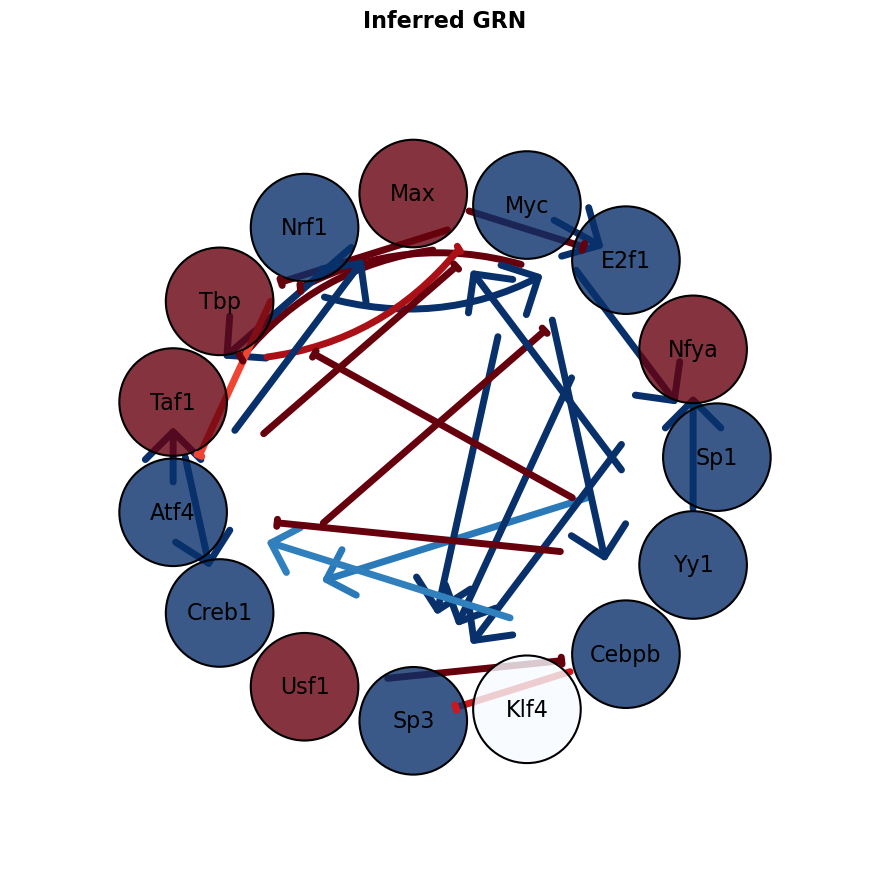

In [167]:
# --- Step 6: Visualize the inferred network ---
if (len(single_state_regulation) >= 0):
    if have_any_output:
        if (len(final_directed_edges) > 0):
            plot_network(direction_normalized_matrix, gene_list, final_directed_edges)
        else:
            plot_network(direction_normalized_matrix, gene_list, final_directed_edges)

try:
    correlation_matrices = {
        "direction_matrix": direction_normalized_matrix, 
        "direction_raw_matrix": direction_raw_matrix, 
        "pairwise_gene_gene_correlation_matrix": pairwise_gene_gene_correlation_matrix,
        "twin_pair_correlation_matrix_t2": twin_pair_correlation_matrix_t2,
        "random_pair_correlation_matrix_t2": random_pair_correlation_matrix_t2,
        "twin_pair_correlation_matrix_t1": twin_pair_correlation_matrix_t1,
        "random_pair_correlation_matrix_t1": random_pair_correlation_matrix_t1
    }
except:
    correlation_matrices = {
        "direction_matrix": None, 
        "direction_raw_matrix": None, 
        "pairwise_gene_gene_correlation_matrix": pairwise_gene_gene_correlation_matrix,
        "random_pair_correlation_matrix": random_pair_correlation_matrix_t2,
        "twin_pair_correlation_matrix_t2": twin_pair_correlation_matrix_t2,
        "twin_pair_correlation_matrix_t1": twin_pair_correlation_matrix_t1,
    }